# Wind turbines in Schleswig-Holstein [GER]

This notebook displays data from the winturbines in Schleswig-Holstein Germany.
The data for this visual analysis are prvided from the OpenData Portal Schleswig-Holstein, the data is provided by the Landesamt für Umwelt and is available under following link: https://opendata.schleswig-holstein.de/dataset/windkraftanlagen-2023-10-11

The anthropogenic climate change is becomming a huge problem for our planet and society. 
This notebook give a deeper understanding in the ongoing distribution of power planteges by wind energy.

In the beginning of the notebook the data provided will be preprocessed to be in the right format for the later analysis.
After that a map of schleswig-holstein will be displayed that displays the gemeinden that are contributing alot of wind energy to the power-network. 
After watching the map of schleswig-holstein we are going to take a deeper look into the available and growing power provided by wind turbines in schleswig-holstein wich then brings us the a graph displaying the time difference between approval and start of operation.


At the end we are going to dive into 

In [64]:
# importing all nececary libs:
import pandas as pd
import numpy as np
import altair as alt
import geoplot as gplt
import geopandas as gpd
import geoplot.crs as gcrs
import matplotlib.pyplot as plt
import pyproj
import re

In [65]:
# reading in data
windTurbine = pd.read_csv("data/opendata_wka_ib_gv_vb_sh_k_20231011.csv", sep=";")
gdf = gpd.GeoDataFrame.from_file("data/gemeinden_simplify20.geojson")

# Data Cleaning and preperation

In [66]:
# convertig the NABENHOEHE, ROTORDURCHMESSER from string to float and replace the ',' with '.'
windTurbine["NABENHOEHE"] = windTurbine["NABENHOEHE"].str.replace(",", ".").astype(float)
windTurbine["ROTORDURCHMESSER"] = windTurbine["ROTORDURCHMESSER"].str.replace(",", ".").astype(float)

In [67]:
# transform inbetriebnahme to datetime dd.mm.yyyy
windTurbine["GENEHMIGT_AM"] = pd.to_datetime(windTurbine["GENEHMIGT_AM"], format="%d.%m.%Y")
windTurbine["INBETRIEBNAHME"] = pd.to_datetime(windTurbine["INBETRIEBNAHME"], format="%d.%m.%Y")
windTurbine["DATENDATUM"] = pd.to_datetime(windTurbine["DATENDATUM"], format="%d.%m.%Y")

In [68]:
# converting the Schallleistungsspiegel into float

def convert_to_float(value):
    if pd.isnull(value):
        return np.nan
    match = re.search(r'\d+,\d+', value)
    if match:
        return float(match.group().replace(',', '.'))
    return np.nan

# Apply the function to your column
windTurbine['SCHALLLEISTUNGSPEGELConverted'] = windTurbine['SCHALLLEISTUNGSPEGEL'].apply(convert_to_float)


# sadly the variable does not follow a specific standard wich makes tranksformation
# without manualy applying impossible, since DB and HZ are mixed up

In [69]:
# the wind turbine with Inbetriebnhame on 1996-04-01 looks kinda sus since its is the type Tacke TW 600 
# but it shows that it produces 6000kw wich is alot for that date
# my resarch found out that the tacke tw 600 only has 600kw so we are going to correct it

#print(windTurbine[windTurbine["INBETRIEBNAHME"] == "1996-04-01"].head())

#correct the LEISTUNG to 600 for Entry 2900
windTurbine.loc[2900, "LEISTUNG"] = 600


In [70]:
# Calculate the yearly energy ganing

# Extract the year from the 'INBETRIEBNAHME' column
windTurbine['Year'] = windTurbine['INBETRIEBNAHME'].dt.year

# Group by year and sum the 'LEISTUNG' column
df_yearly = windTurbine.groupby('Year')['LEISTUNG'].sum().reset_index()

# Calculate the cumulative sum to get the total available energy up to each year
df_yearly['Cumulative_LEISTUNG'] = df_yearly['LEISTUNG'].cumsum()

# Calculate the newly added energy for each year
df_yearly['Added_LEISTUNG'] = df_yearly['Cumulative_LEISTUNG'].diff()
df_yearly.loc[df_yearly['Year'] == df_yearly['Year'].min(), 'Added_LEISTUNG'] = df_yearly.loc[df_yearly['Year'] == df_yearly['Year'].min(), 'LEISTUNG']


In [71]:
# since there are few wind turbines with an older inbetriebnahme date than 1960 we are going to create a new
# dataframe for date analysis that does not consider these turbines since they are probably a mistake in the data
windTurbineDate = windTurbine[windTurbine["INBETRIEBNAHME"] > "1960-01-01"]

# there are also turbines with a GENEHMIGT_AM date older than 1960 but with an Inbetriebnahme younger than 1960
# we are going to drop these turbines
windTurbineDate = windTurbineDate[windTurbineDate["GENEHMIGT_AM"] > "1960-01-01"]

In [72]:
# converting the used coordinates into lat/lon using pyproj
def convert_coordinates(df, easting_col, northing_col):
    # Define the projections
    utm_proj = pyproj.Proj(proj='utm', zone=32, ellps='WGS84')  # UTM coordinates (assuming zone 32)
    latlong_proj = pyproj.Proj(proj='latlong', datum='WGS84')  # LatLon with WGS84 datum used by GPS units and Google Earth

    # Create a transformer object
    transformer = pyproj.transformer.Transformer.from_proj(utm_proj, latlong_proj)

    # Apply the conversion to each row in the dataframe
    df['Longitude'], df['Latitude'] = transformer.transform(df[easting_col].values, df[northing_col].values)

    return df


# Convert the coordinates
windTurbine = convert_coordinates(windTurbine, 'OSTWERT', 'NORDWERT')

In [73]:
# Count the number of wind turbines per gemeinde
turbine_counts = windTurbine['GEMEINDE'].value_counts().reset_index()
turbine_counts.columns = ['GEN', 'count']

# Merge the turbine counts with the geopandas dataframe
merged = gdf.set_index('GEN').join(turbine_counts.set_index('GEN'))

# Fill NA/NaN values with 0
merged['count'] = merged['count'].fillna(0)

In [74]:
# Calculate the difference in days between 'INBETRIEBNAHME' and 'GENEHMIGT_AM'
windTurbineDate['Time_Difference'] = (windTurbineDate['INBETRIEBNAHME'] - windTurbineDate['GENEHMIGT_AM']).dt.days

# Create a new column for the year
windTurbineDate['Year'] = windTurbineDate['GENEHMIGT_AM'].dt.year

# Visualization

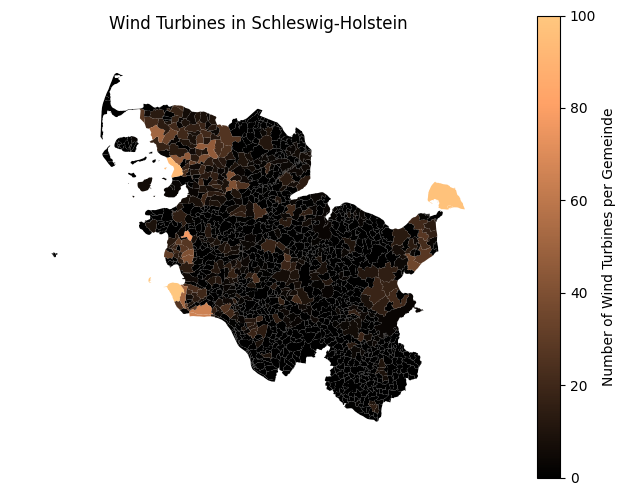

In [75]:
# Plot the data using geoplot
ax = gplt.choropleth(
    merged, hue='count', projection=gcrs.WebMercator(), 
    linewidth=0.5,
    cmap="copper",
    legend=True, legend_kwargs={'label': "Number of Wind Turbines per Gemeinde"}
)

plt.title("Wind Turbines in Schleswig-Holstein")
plt.show()


maybe in regard to the overall opinion in the media you can see that only certent hotspots are filled with wind turbines as stated by the bild media: https://www.bild.de/regional/frankfurt/frankfurt-aktuell/7-windraeder-sollen-panorama-verschandeln-dorf-kaempft-gegen-windmuehlen-84007840.bild.html



In [76]:
# Create the Altair chart for total available energy
chart1 = alt.Chart(df_yearly).mark_bar().encode(
    x=alt.X('Year:O', title='Year of Operation'),
    y=alt.Y('Cumulative_LEISTUNG:Q', title='Total Power Available (in KW)'),
    color=alt.value('blue'),
    tooltip=['Year', 'Cumulative_LEISTUNG']
).properties(
    title='Total Available Power per Year'
)

# Create the Altair chart for newly added energy
chart2 = alt.Chart(df_yearly).mark_bar().encode(
    x='Year:O',
    y=alt.Y('Added_LEISTUNG:Q', title='Power Added Each Year (in KW)'),
    color=alt.value('red'),
    tooltip=['Year', 'Added_LEISTUNG']
)

# Combine the charts
chart = chart1 + chart2

# Add a legend
legend = alt.Legend(title="Power Type")
chart.encoding.color = alt.Color('Color:N', scale=None, legend=legend)

# Display the chart
chart


alt.LayerChart(...)

In [77]:
# Create the boxplot
boxplot = alt.Chart(windTurbineDate).mark_boxplot().encode(
    x='Year:O',
    y=alt.Y('Time_Difference:Q', title='Time Difference (in days)'),
    tooltip=['Time_Difference']
)

# Create the mean point plot
mean = alt.Chart(windTurbineDate).mark_point(color='red', filled=True).encode(
    x='Year:O',
    y='mean(Time_Difference):Q'
)

# Combine the plots
chart = boxplot + mean

chart.properties(
    title='Boxplot of Time Difference from Approval to First Energy Produced Over the Years'
)


alt.LayerChart(...)

In [78]:
chart = alt.Chart(windTurbine).mark_circle(aspect=True).encode(
    x='NABENHOEHE',
    y='LEISTUNG',
    size='ROTORDURCHMESSER',
    color='ROTORDURCHMESSER',
    tooltip=['NABENHOEHE', 'ROTORDURCHMESSER', 'LEISTUNG']
).properties(
    width=400 ,
    height=400
).interactive()

chart


alt.Chart(...)

there are 32 wind turbines where that have been taken into betriebnahme before the were genehmigt

In [79]:
# i would like to show if the LEISTUNG of the wind turbines are getting higher with the years 

In [80]:
# Can you please priovide me with a graph that shows the available power per year, im expecting a altair chart that accumulates the produced energy by year wich uses the innbetriebnhame variable as staring point, the dataframe i have looks like this:



In [81]:
# create a boxplot by windTurbine["HERSTELLER"] and the mean Leistung, sort by mean Leistung

chart = alt.Chart(windTurbine).mark_boxplot().encode(
    x=alt.X('HERSTELLER', sort='x'),
    y='NABENHOEHE',
).properties(
    width=400 ,
    height=400
).interactive()

chart

alt.Chart(...)

<Axes: ylabel='count'>

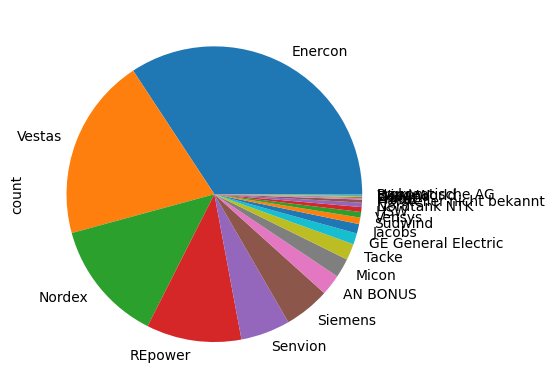

In [82]:
# print distrubition of the wind turbine manufacturers
windTurbine["HERSTELLER"].value_counts().plot(kind="pie")

In [83]:
# plot INBETRIEBNAHME and LEISTUNG with altair

alt.Chart(windTurbineDate).mark_circle().encode(
    x='INBETRIEBNAHME',
    y='LEISTUNG',
    tooltip=['INBETRIEBNAHME', 'LEISTUNG']
).properties(
    width=400 ,
    height=400
).interactive()

alt.Chart(...)

# Sumary

## Limitations

In this research the focus was only provided onto wind turbines that are operating in schleswig-holstein and not a country wide overlook since of missing data in that field, futher research should also take the general power creation into account.


Since it is impossible to find out since when the wind turbines that are currently not in the "in Betrieb" status are in the proccess of being approved they got treated as they had already been build. As shown in one of the previous graphs once the wind turbines are approve it takes aprox 2 to 3 years till they are build and are ready to operate.



## Improvements to be made

### Data Quality

Sadly the data provided by the OpenData Portal Schleswig-Holstein werent in the optimal quality that is needed for comprehensive Data Analysis.
For example there is a mistakes in the dataset where a wind turbines are labeld with a higher power than the type of windturbine actualy can produce. In this case it was easy to find out, since the Typ was given with a bit of research but this shows that the dataset does not undergo comprehensive quality controll, this also shows in the INNBETRIEBNAHME and GENEHMIGT_AM attribute.
Aswell as the datatypes of the attributes are now standertised so is the SCHALLLEISTUNGSPEGEL for example are statet in very different ways.
